**Note:** directly imported from my private kaggle notebook so if you want to run this notebook you can directly import this in kaggle, i might not make it public because it is using same elements of my dehazing notebook, i just make few changes like implementing nafnet instead of unet, except that nearly everything is same so i felt there is no need to make this public and end result of deblurring model is also not that great, it works really well in certain cases while performs really bad in some conditions.

In [1]:
!pip install segmentation-models-pytorch pytorch-lightning dblur

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.3/76.3 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.9/106.9 kB 7.3 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=619eb7594397f4a8aeb610c6e6379616141776287f8cd11f12e9528334bc4cc7
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=122ac8bdaec0c05bc6b9d35dd879c61a9ce1241721047aa59a8e666a5bceeedc
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytorc

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from os.path import join, isfile 
from PIL import Image  # For reading images
from tqdm import tqdm
from os import scandir
import torchvision.io as io
from torchvision.io import read_image, ImageReadMode

import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torchvision import transforms
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader, Dataset
from pytorch_lightning.callbacks import TQDMProgressBar


# Preparing the Dataset

In [3]:

# Define the root directory of the dataset
root_dir = '/kaggle/input/a-curated-list-of-image-deblurring-datasets/DBlur'

# This list will hold our mapping information
dataset_mapping = []

# Loop over the first-level datasets inside DBlur, with a tqdm progress bar
for dataset_name in tqdm(os.listdir(root_dir), desc="Datasets"):
    dataset_path = os.path.join(root_dir, dataset_name)
    if not os.path.isdir(dataset_path):
        continue  # Skip if not a directory

    # Loop over each split (e.g., train, test, validation) in the dataset folder
    for split_name in os.listdir(dataset_path):
        split_path = os.path.join(dataset_path, split_name)
        if not os.path.isdir(split_path):
            continue  # Skip if not a directory

        # Set paths for the potential sharp and blur folders
        sharp_folder = os.path.join(split_path, 'sharp')
        blur_folder = os.path.join(split_path, 'blur')

        # Check if both sharp and blur subfolders exist for this split
        if os.path.isdir(sharp_folder) and os.path.isdir(blur_folder):
            # List files in both folders (sorted so that order is consistent)
            sharp_files = sorted(os.listdir(sharp_folder))
            blur_files = sorted(os.listdir(blur_folder))
            
            # Intersection of the two lists is used to ensure robustness.
            common_files = sorted(list(set(sharp_files) & set(blur_files)))
            
            for file in common_files:
                sharp_path = os.path.join(sharp_folder, file)
                blur_path = os.path.join(blur_folder, file)
                dataset_mapping.append({
                    'dataset': dataset_name,
                    'split': split_name,
                    'filename': file,
                    'sharp_path': sharp_path,
                    'blur_path': blur_path
                })
        else:
            tqdm.write(f"Skipping mapping for {dataset_name}/{split_name} because either 'sharp/' or 'blur/' is missing.")

df_mapping = pd.DataFrame(dataset_mapping)
print(df_mapping.head())
print(f"Total mapped pairs: {len(dataset_mapping)}")


Datasets: 100%|██████████| 8/8 [00:18<00:00,  2.35s/it]

      dataset       split filename  \
0  Wider-Face  validation    0.jpg   
1  Wider-Face  validation    1.jpg   
2  Wider-Face  validation   10.jpg   
3  Wider-Face  validation  100.jpg   
4  Wider-Face  validation  101.jpg   

                                          sharp_path  \
0  /kaggle/input/a-curated-list-of-image-deblurri...   
1  /kaggle/input/a-curated-list-of-image-deblurri...   
2  /kaggle/input/a-curated-list-of-image-deblurri...   
3  /kaggle/input/a-curated-list-of-image-deblurri...   
4  /kaggle/input/a-curated-list-of-image-deblurri...   

                                           blur_path  
0  /kaggle/input/a-curated-list-of-image-deblurri...  
1  /kaggle/input/a-curated-list-of-image-deblurri...  
2  /kaggle/input/a-curated-list-of-image-deblurri...  
3  /kaggle/input/a-curated-list-of-image-deblurri...  
4  /kaggle/input/a-curated-list-of-image-deblurri...  
Total mapped pairs: 223792


In [4]:
# Filter out entries related to 'CelebA'
dataset_mapping = [entry for entry in dataset_mapping if entry['dataset'] not in ['CelebA']] #,'Helen','Wider-Face'

# Convert the filtered mapping to a Pandas DataFrame
df_mapping = pd.DataFrame(dataset_mapping)

print(df_mapping.head())
print(f"Total mapped pairs after filtering: {len(dataset_mapping)}")


# Create separate DataFrames for each split
df_train = df_mapping[df_mapping['split'].isin(['train', 'validation'])]
df_test = df_mapping[df_mapping['split'] == 'test']


# Group by both "dataset" and "split", then count the number of mapping entries (files)
file_counts = df_train.groupby(['dataset', 'split']).size().reset_index(name='file_count')

print(file_counts)


      dataset       split filename  \
0  Wider-Face  validation    0.jpg   
1  Wider-Face  validation    1.jpg   
2  Wider-Face  validation   10.jpg   
3  Wider-Face  validation  100.jpg   
4  Wider-Face  validation  101.jpg   

                                          sharp_path  \
0  /kaggle/input/a-curated-list-of-image-deblurri...   
1  /kaggle/input/a-curated-list-of-image-deblurri...   
2  /kaggle/input/a-curated-list-of-image-deblurri...   
3  /kaggle/input/a-curated-list-of-image-deblurri...   
4  /kaggle/input/a-curated-list-of-image-deblurri...   

                                           blur_path  
0  /kaggle/input/a-curated-list-of-image-deblurri...  
1  /kaggle/input/a-curated-list-of-image-deblurri...  
2  /kaggle/input/a-curated-list-of-image-deblurri...  
3  /kaggle/input/a-curated-list-of-image-deblurri...  
4  /kaggle/input/a-curated-list-of-image-deblurri...  
Total mapped pairs after filtering: 21193
      dataset       split  file_count
0       Gopro       trai

# DataLoaders

In [5]:

class ImageDataset(Dataset):
    def __init__(self, df, target_size=(384, 384)):
        self.input = df['blur_path'].tolist()
        self.output = df['sharp_path'].tolist()
        self.target_size = target_size
        self.resize_transform = transforms.Resize(self.target_size)

  
    def __len__(self):
        return len(self.input)

    def __getitem__(self, idx):
        hazy_path = self.input[idx]
        gt_path = self.output[idx]

        # Load images
        img_x = io.read_image(hazy_path, mode=ImageReadMode.RGB)
        img_y = io.read_image(gt_path, mode=ImageReadMode.RGB)

        

        # Apply resize transformation
        img_x = self.resize_transform(img_x)
        img_y = self.resize_transform(img_y)
            
        # Convert images to float and normalize to [0, 1]
        img_x = img_x.float() / 255.0
        img_y = img_y.float() / 255.0

        
        return img_x, img_y



In [6]:
# Create datasets
train_dataset = ImageDataset(df_train)
val_dataset = ImageDataset(df_test)
# DataLoaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=4, shuffle=True,pin_memory=True
                         ,prefetch_factor = 2,persistent_workers=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=4,pin_memory=True)

Input Images Shape: torch.Size([4, 3, 384, 384])
Target Images Shape: torch.Size([4, 3, 384, 384])
Input Images Range: 0.0 - 1.0
Target Images Range: 0.0 - 1.0


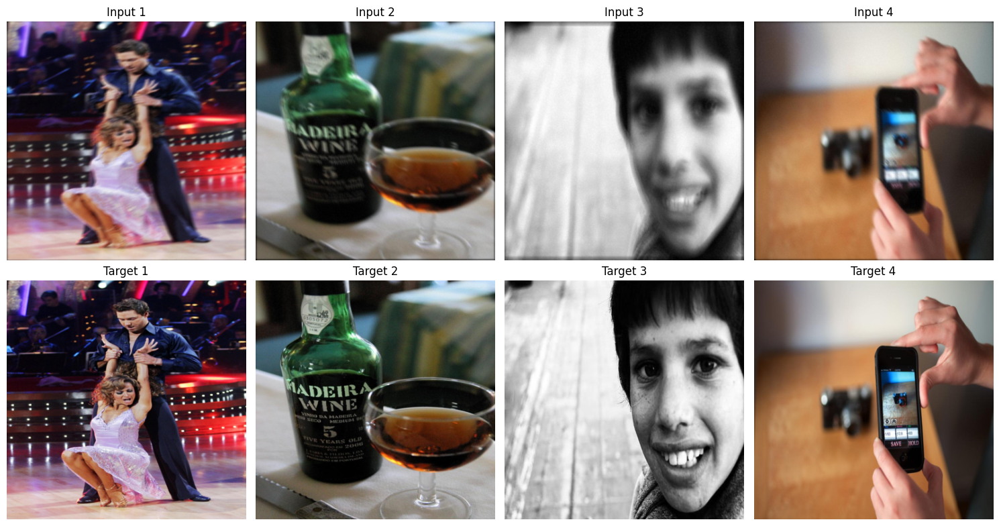


Testing memory management...
First batch shapes: torch.Size([4, 3, 384, 384]), torch.Size([4, 3, 384, 384])
Processed 0 batches
Processed 100 batches
Processed 200 batches


In [7]:
def test_dataset(train_df):
    
   
    
    dataset = ImageDataset(train_df)
    
    # Create DataLoader with a small batch size
    dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
    
    # Get a batch of images
    images, targets = next(iter(dataloader))
    
    # Print shapes and value ranges
    print("Input Images Shape:", images.shape)
    print("Target Images Shape:", targets.shape)
    print("Input Images Range:", images.min().item(), "-", images.max().item())
    print("Target Images Range:", targets.min().item(), "-", targets.max().item())
    
    # Visualize some samples
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    
    # Convert tensors to numpy for visualization
    for i in range(4):
        # Display input images
        img = images[i].permute(1, 2, 0).numpy()
        axes[0, i].imshow(img)
        axes[0, i].axis('off')
        axes[0, i].set_title(f'Input {i+1}')
        
        # Display target images
        target = targets[i].permute(1, 2, 0).numpy()
        axes[1, i].imshow(target)
        axes[1, i].axis('off')
        axes[1, i].set_title(f'Target {i+1}')
    
    plt.tight_layout()
    plt.show()
    
    # Test memory management
    print("\nTesting memory management...")
    for i, (batch_x, batch_y) in enumerate(dataloader):
        if i == 0:
            print(f"First batch shapes: {batch_x.shape}, {batch_y.shape}")
        if i % 100 == 0:
            print(f"Processed {i} batches")
        if i >= 200:  # Test first 200 batches
            break

# Run the test
test_dataset(df_train)


# Model Architecture



**Resources:** 
- https://github.com/Jishnu8/DBlur-An-Image-Deblurring-Toolkit/tree/main
- https://github.com/megvii-research/NAFNet

In [8]:
class PerceptualLoss(nn.Module):
    def __init__(self):
        super().__init__()
        # Using VGG16 features for perceptual loss
        vgg = models.vgg16(weights='VGG16_Weights.DEFAULT').features
        self.blocks = nn.ModuleList([
            vgg[:4],  # conv1_2
            vgg[4:9],  # conv2_2
            vgg[9:16],  # conv3_3
        ])

        # Register normalization parameters
        self.register_buffer('mean', torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))
        self.register_buffer('std', torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))
        
        for bl in self.blocks:
            for p in bl.parameters():
                p.requires_grad = False
            bl.eval()

    def normalize(self, x):
        return (x - self.mean) / self.std
        
    def forward(self, x, y):

        # Normalize both inputs
        x = self.normalize(x)
        y = self.normalize(y)
        
        loss = 0
        for block in self.blocks:
            x = block(x)
            y = block(y)
            loss += F.l1_loss(x, y)
        return loss




In [9]:
from dblur.models.nafnet import NAFNet
from dblur.models.restormer import Restormer
from torchsummary import summary

'''model = NAFNet(
    projected_in_channels=24,  # Reduced from 32
    enc_num=[1, 1, 1, 12],     # Reduced depth in the deepest layer
    middle_num=1,
    dec_num=[1, 1, 1, 1],      # Same decoder depth
    attn_expansion_factor=2,
    ffn_expansion_factor=2,
    gate_reduction_factor=2,
    dropout_rate=0,
    upscale_factor=2,
    attn_kernel_size=3,
    upscale_kernel_size=1,
    bias=True,
    upscale_bias=False
)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
summary(model, (3, 384, 384))'''


"model = NAFNet(\n    projected_in_channels=24,  # Reduced from 32\n    enc_num=[1, 1, 1, 12],     # Reduced depth in the deepest layer\n    middle_num=1,\n    dec_num=[1, 1, 1, 1],      # Same decoder depth\n    attn_expansion_factor=2,\n    ffn_expansion_factor=2,\n    gate_reduction_factor=2,\n    dropout_rate=0,\n    upscale_factor=2,\n    attn_kernel_size=3,\n    upscale_kernel_size=1,\n    bias=True,\n    upscale_bias=False\n)\n\n# Move the model to GPU if available\ndevice = torch.device('cuda' if torch.cuda.is_available() else 'cpu')\nmodel.to(device)\nsummary(model, (3, 384, 384))"

In [10]:
import torch
import torch.nn as nn
from torchmetrics.image import PeakSignalNoiseRatio


class PSNRLoss(nn.Module):
    """
    PSNR loss for image deblurring used for training NAFNet. 
    
    Details regarding the loss function can be found in the paper "Simple 
    Baselines for Image Restoration".  
    """

    def __init__(self):
        super(PSNRLoss, self).__init__()
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.psnr = PeakSignalNoiseRatio(data_range=1).to(device)
        self.mse_loss = nn.MSELoss()
        self.max_pixel_value = 255

    def forward(self, output, target):
        return -self.psnr(output, target)

In [11]:




class LitUModel(pl.LightningModule):
    def __init__(self, learning_rate=7e-4, weight_decay=1e-4):
        super(LitUModel, self).__init__()
        
        
        self.model = NAFNet(
            projected_in_channels=24,  
            enc_num=[1, 1, 1, 12],    
            middle_num=1,
            dec_num=[1, 1, 1, 1],     
            attn_expansion_factor=2,
            ffn_expansion_factor=2,
            gate_reduction_factor=2,
            dropout_rate=0,
            upscale_factor=2,
            attn_kernel_size=3,
            upscale_kernel_size=1,
            bias=True,
            upscale_bias=True
        )
        '''self.model = NAFNet(
            projected_in_channels=16, 
            enc_num=[1, 2, 4, 8],     
            middle_num=1,
            dec_num=[1, 1, 1, 1],    
            attn_expansion_factor=2,
            ffn_expansion_factor=2,
            gate_reduction_factor=2,
            dropout_rate=0.3,
            upscale_factor=2,
            attn_kernel_size=3,
            upscale_kernel_size=1,
            bias=True,
            upscale_bias=True)'''
        
        self.learning_rate = learning_rate
        self.weight_decay = weight_decay

        # Loss components
        self.mse_loss = nn.MSELoss()
        self.l1_loss = nn.L1Loss()
        self.psnr_loss = PSNRLoss()
        self.perceptual_loss = PerceptualLoss()
        
        # Loss weights
        self.lambda_mse = 0.0
        self.lambda_l1 = 0
        self.lambda_perceptual = 0.3
        self.lambda_psnr = 0.7

    def forward(self, x):
        return self.model(x)


    def compute_total_loss(self, outputs, targets):
        # MSE Loss
        mse = self.mse_loss(outputs, targets)
        
        # L1 Loss
        l1 = self.l1_loss(outputs, targets)

        psnr = self.psnr_loss(outputs, targets)
        
        # Perceptual Loss
        perceptual = self.perceptual_loss(outputs, targets)
        
        # Total weighted loss
        total_loss = (self.lambda_mse * mse + 
                     self.lambda_l1 * l1 + self.lambda_psnr * psnr
                     + self.lambda_perceptual * perceptual)
        
        return total_loss, mse, l1

    
    def training_step(self, batch, batch_idx):
        images, targets = batch
        outputs = self(images)
        total_loss, mse, l1 = self.compute_total_loss(outputs, targets)
        
        # Log all losses
        self.log('train_total_loss', total_loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log('train_mae', l1, prog_bar=True, on_epoch=True)
        return total_loss

    def validation_step(self, batch, batch_idx):
        images, targets = batch
        outputs = self(images)
        total_loss, mse, l1 = self.compute_total_loss(outputs, targets)
        
        # Log all losses
        self.log('val_total_loss', total_loss, prog_bar=True, on_epoch=True)
        self.log('val_mae', l1, prog_bar=True, on_epoch=True)
        return total_loss

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=self.learning_rate,weight_decay=self.weight_decay)
        return optimizer

    # Save function for the model state
    def save(self, path):
        torch.save(self.state_dict(), path)
        print(f"Model saved at {path}")

    # Class method to load the model for inference
    @classmethod
    def load_for_inference(cls, path, device='cpu'):
        # Create an instance without initializing other components
        model = cls()
        
        # Load state dict
        state_dict = torch.load(path, map_location=device,weights_only=True)
        model.load_state_dict(state_dict)
        
        # Set to evaluation mode
        model.eval()
        
        print(f"Model loaded from {path} for inference")
        return model

# Training model using pytorch lightning

In [12]:
model = LitUModel()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 217MB/s] 


In [17]:
from pytorch_lightning.callbacks import ModelCheckpoint

checkpoint_callback = ModelCheckpoint(save_top_k=0)

class CustomProgressBar(TQDMProgressBar):
    def init_validation_tqdm(self):
        # Return a disabled tqdm progress bar to prevent errors
        bar = tqdm(disable=True)
        return bar

    def init_test_tqdm(self):
        bar = tqdm(disable=True)
        return bar

    def init_predict_tqdm(self):
        bar = tqdm(disable=True)
        return bar
progress_bar = CustomProgressBar(refresh_rate=1,leave=True)


trainer = pl.Trainer(
    max_epochs=1,
    accelerator='auto',
    devices='auto',
    callbacks=[progress_bar,checkpoint_callback],
    precision='16-mixed', 
    logger=False,
    limit_train_batches=400,
    limit_val_batches=100
)


In [15]:
from torchsummary import summary
model = model.cuda()

summary(model, input_size=(3, 384, 384))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 24, 384, 384]             672
         LayerNorm-2           [-1, 147456, 24]              48
            Conv2d-3         [-1, 48, 384, 384]           1,200
            Conv2d-4         [-1, 48, 384, 384]             480
        SimpleGate-5         [-1, 24, 384, 384]               0
 AdaptiveAvgPool2d-6             [-1, 24, 1, 1]               0
            Conv2d-7             [-1, 24, 1, 1]             600
               SCA-8             [-1, 24, 1, 1]               0
            Conv2d-9         [-1, 24, 384, 384]             600
         Identity-10         [-1, 24, 384, 384]               0
        AttnBlock-11         [-1, 24, 384, 384]               0
        LayerNorm-12           [-1, 147456, 24]              48
           Conv2d-13         [-1, 48, 384, 384]           1,200
       SimpleGate-14         [-1, 24, 3

In [18]:
trainer.fit(model, train_loader, val_loader)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

# Comparing predicted output

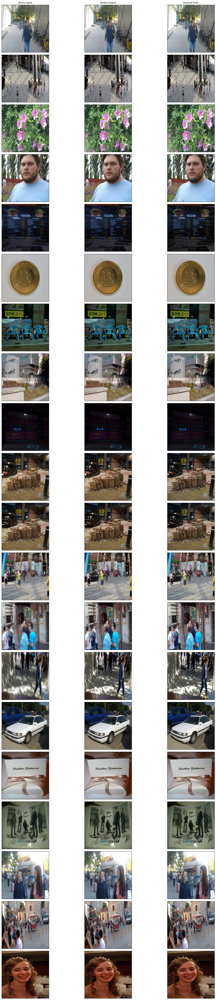

In [20]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np



# Create dataset instance
test_dataset = val_dataset

# Select 20 random indices
random_indices = np.random.choice(len(test_dataset), 20, replace=False)

# Create figure
fig, axes = plt.subplots(20, 3, figsize=(15, 60))

# Set model to eval mode
model.eval()
device = next(model.parameters()).device

# Process images
for i, idx in enumerate(random_indices):
    try:
        # Get preprocessed images directly from dataset
        img_hazy, img_gt = test_dataset[idx]
        
        # Model inference
        with torch.no_grad():
            output = model(img_hazy.unsqueeze(0).to(device)).cpu()
            output = torch.clamp(output, 0, 1)
        
        # Display images
        axes[i, 0].imshow(img_hazy.permute(1, 2, 0).numpy())
        axes[i, 1].imshow(output.squeeze().permute(1, 2, 0).numpy())
        axes[i, 2].imshow(img_gt.permute(1, 2, 0).numpy())
        
        # Formatting
        for ax in axes[i]:
            ax.set_xticks([])
            ax.set_yticks([])
            
        if i == 0:
            axes[i, 0].set_title('Blurry Input', fontsize=10)
            axes[i, 1].set_title('Model Output', fontsize=10)
            axes[i, 2].set_title('Ground Truth', fontsize=10)

    except Exception as e:
        print(f"Skipping index {idx} due to error: {str(e)}")
        continue

plt.tight_layout()
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

# Saving the model

In [21]:
torch.save(model.state_dict(), "model_state_20_new.pth")


In [13]:
# Define the architecture (ensure encoder_weights=None for offline use)
'''model = smp.Unet(encoder_name="resnet34",         # Same encoder used during training
                 encoder_weights=None,            # No pre-trained weights required
                 in_channels=3,                   # Same input channels
                 classes=1)       '''  

model.load_state_dict(torch.load("model_state_15_new.pth",weights_only=True))

<All keys matched successfully>

In [22]:
model = LitUModel.load_for_inference('model_state_10.pth', device='cuda')
model.to('cuda')
print("done")



RuntimeError: Error(s) in loading state_dict for LitUModel:
	Missing key(s) in state_dict: "perceptual_loss.mean", "perceptual_loss.std", "perceptual_loss.blocks.0.0.weight", "perceptual_loss.blocks.0.0.bias", "perceptual_loss.blocks.0.2.weight", "perceptual_loss.blocks.0.2.bias", "perceptual_loss.blocks.1.5.weight", "perceptual_loss.blocks.1.5.bias", "perceptual_loss.blocks.1.7.weight", "perceptual_loss.blocks.1.7.bias", "perceptual_loss.blocks.2.10.weight", "perceptual_loss.blocks.2.10.bias", "perceptual_loss.blocks.2.12.weight", "perceptual_loss.blocks.2.12.bias", "perceptual_loss.blocks.2.14.weight", "perceptual_loss.blocks.2.14.bias". 